In [4]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
import shapefile as shp
# import contextily as cx
# import os
# from pathlib import Path
from pandas_profiling import ProfileReport
%matplotlib inline

## Import Data

In [49]:
cars_df = pd.read_csv("data/car-assignments.csv")
cc_df = pd.read_csv("data/cc_data.csv")
gps_df = pd.read_csv("data/gps.csv")
loyalty_df = pd.read_csv("data/loyalty_data.csv")

## Join Dataframes

In [55]:
loyalty_df['FullName'] = loyalty_df['FirstName'].astype(str)+'_'+loyalty_df['LastName'].astype(str)
cc_df['FullName'] = cc_df['FirstName'].astype(str)+'_'+cc_df['LastName'].astype(str)
cars_df['FullName'] = cars_df['FirstName'].astype(str)+'_'+cars_df['LastName'].astype(str)
# purchases = cc.join('loyalty', 
purchases_df = cc_df.merge(cars_df.drop(['FirstName','LastName'], axis=1), how='outer',left_on='FullName', right_on='FullName')
personnel_df = gps_df.merge(cars_df.drop(['FirstName','LastName'],axis=1), how='inner',left_on='id', right_on='CarID').drop('CarID', axis=1)

## Map of Island with Streets Overlay

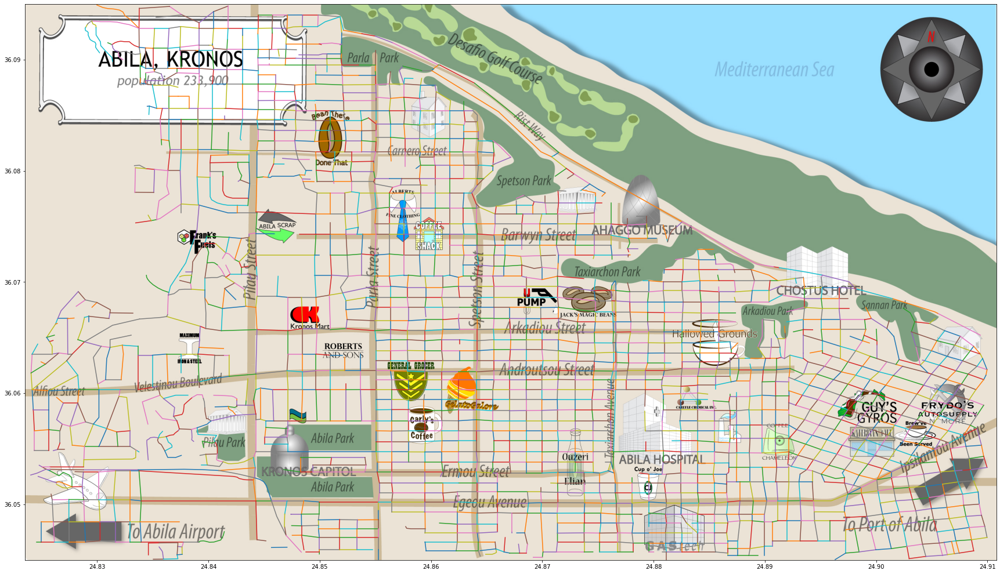

In [51]:
# sf = shp.Reader("Kronos_Island.shp")
sf = shp.Reader("Abila.shp")
# sf = 
img = plt.imread("map-tourist.jpg")

fig, ax = plt.subplots(figsize=(30,20))
for shape in sf.shapeRecords():
    x = [i[0] for i in shape.shape.points[:]]
    y = [i[1] for i in shape.shape.points[:]]
    plt.plot(x,y,zorder=1)
# First attempt at lining up image and gps
# plt.imshow(img,zorder=0,extent=[24.82, 24.91, 36.04, 36.10])
plt.imshow(img,zorder=0,extent=[24.8235, 24.9108, 36.045, 36.095])
plt.show()

## GPS by CarID

In [52]:
# # This works listing the CarID
# img = plt.imread("map-tourist.jpg")
# for i in gps['id'].unique():
#     fig, ax = plt.subplots(figsize=(18,18))
#     ax.imshow(img, extent=[24.8235, 24.9108, 36.045, 36.095])
#     ax = plt.scatter(gps.loc[gps.id==i,'long'].values, gps.loc[gps.id==i,'lat'].values, color='red', s=0.5, label=i, alpha=0.1)
#     plt.legend()
#     plt.show()

## GPS by Employee

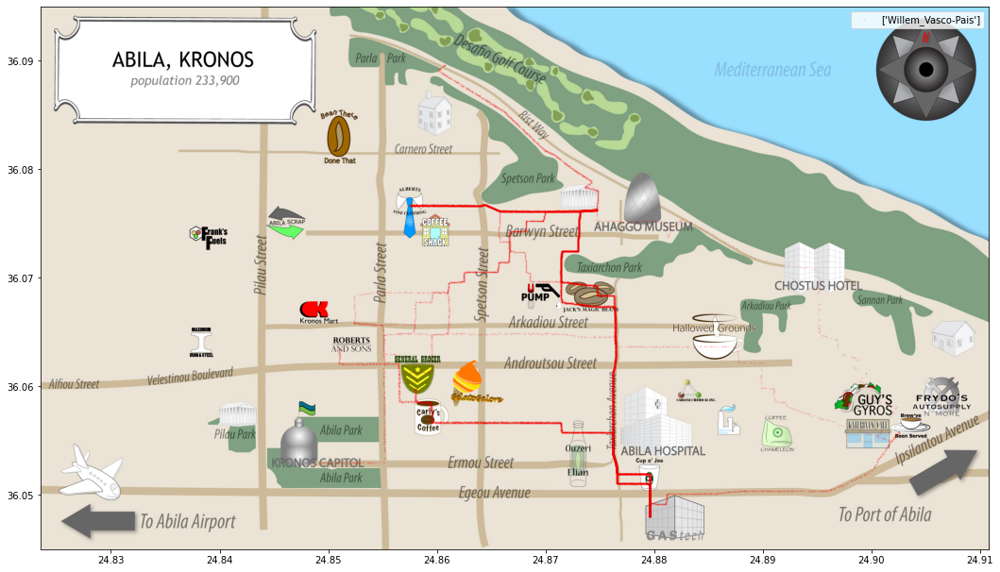

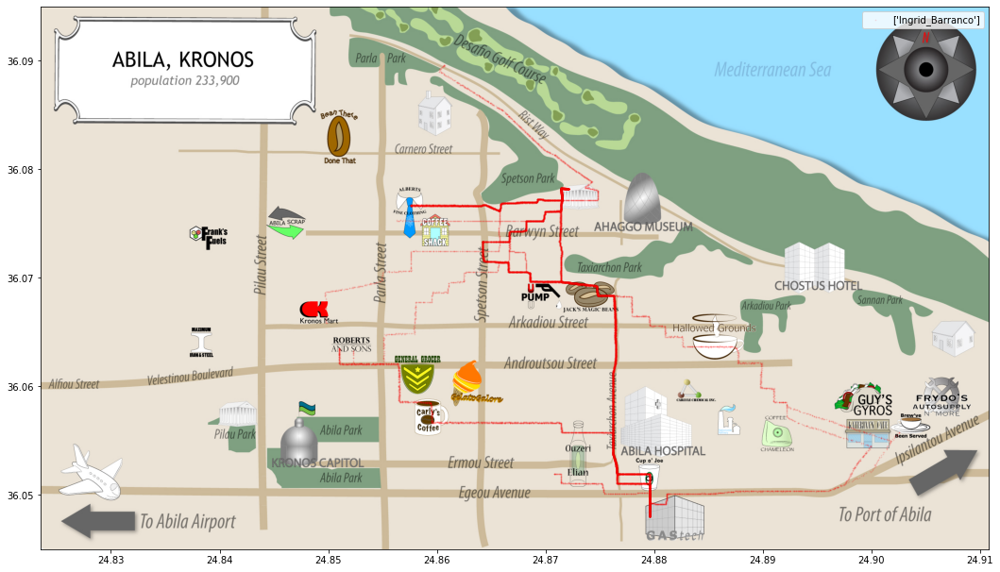

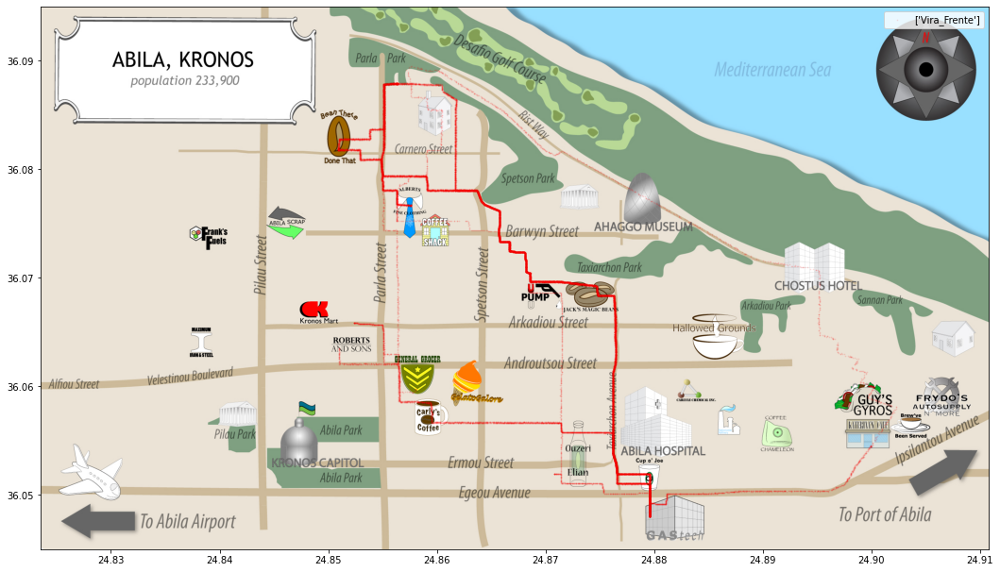

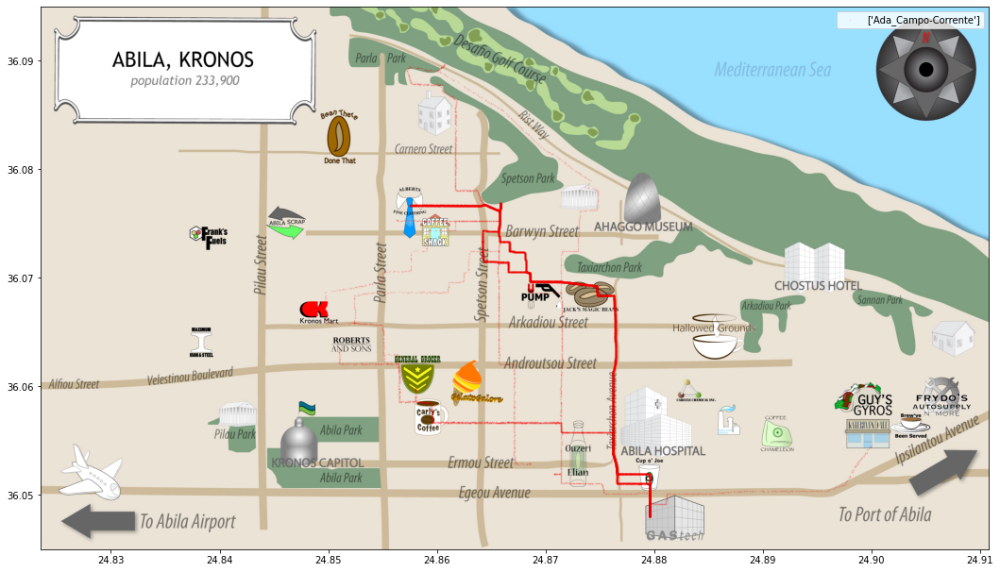

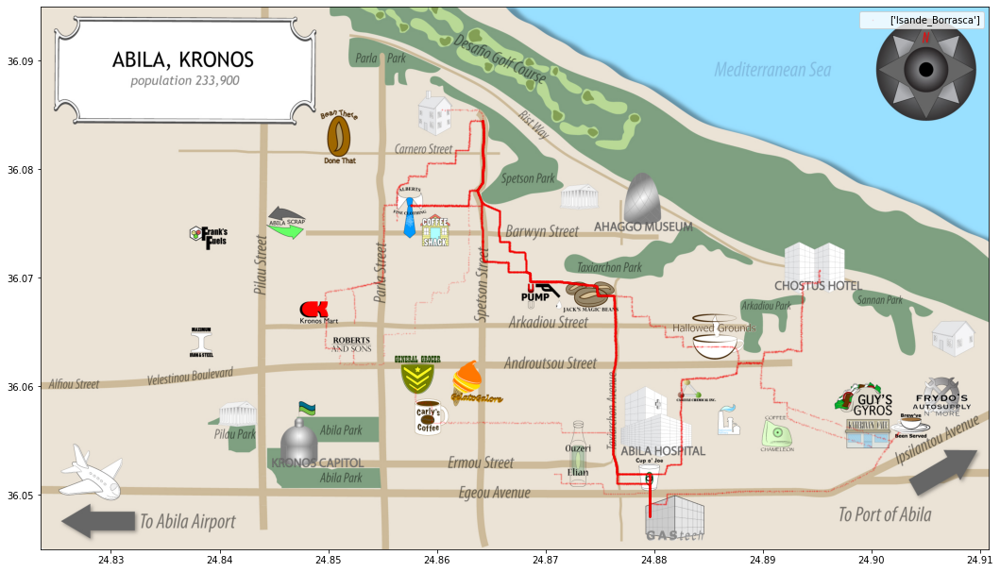

...

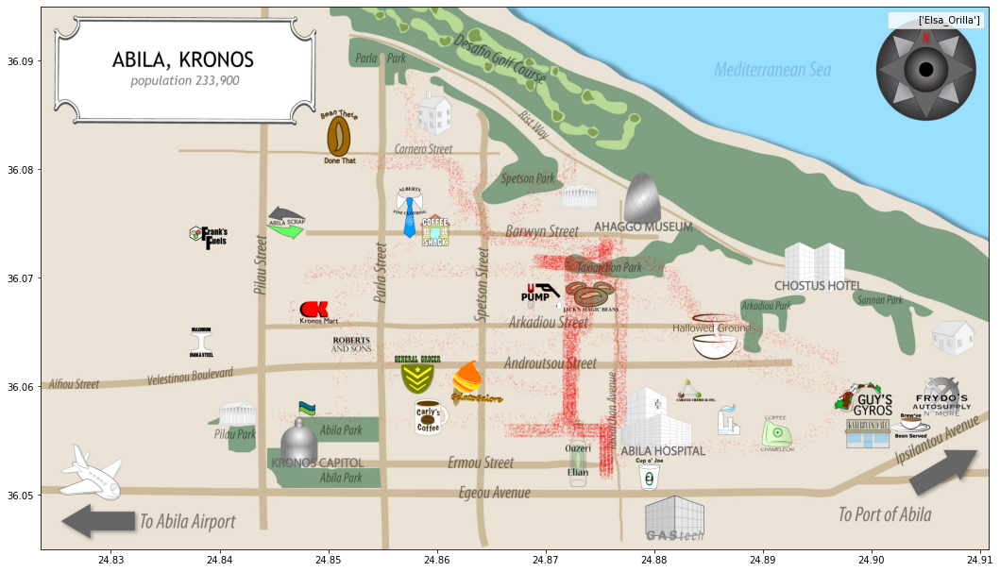

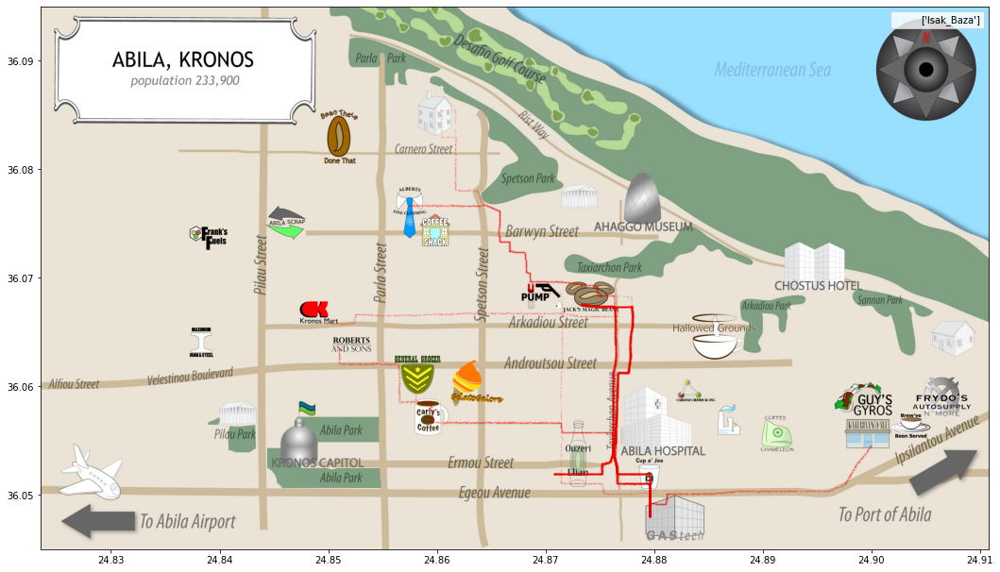

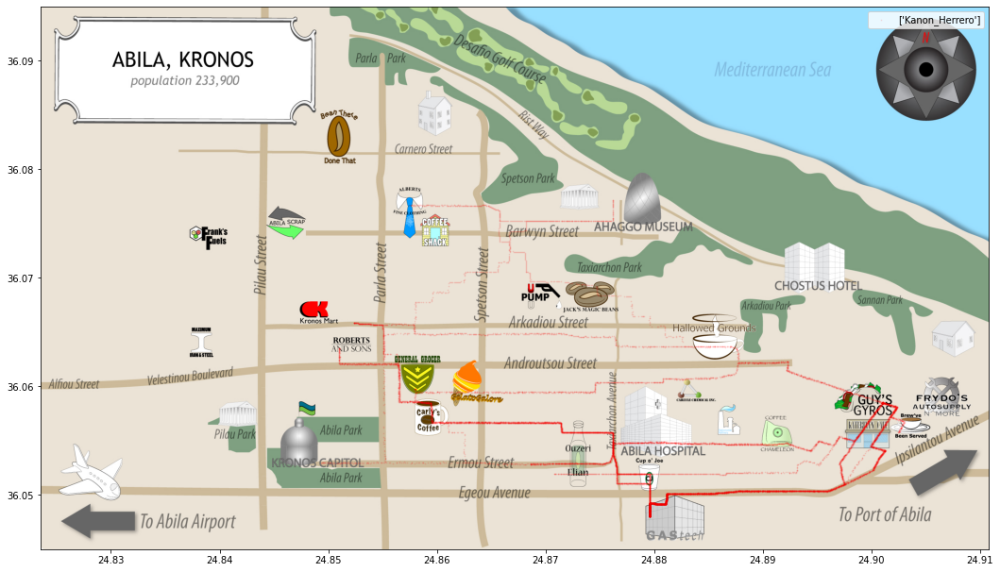

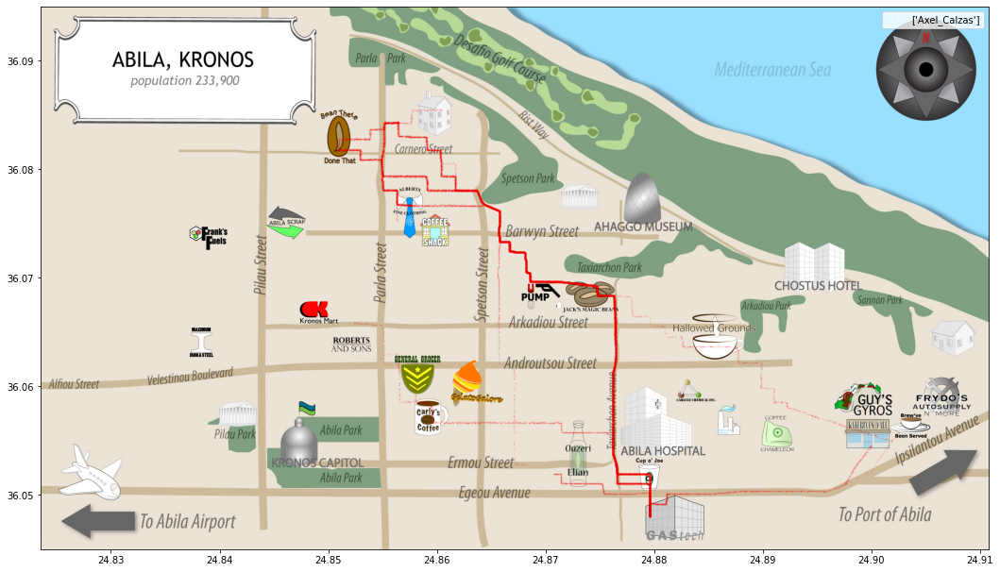

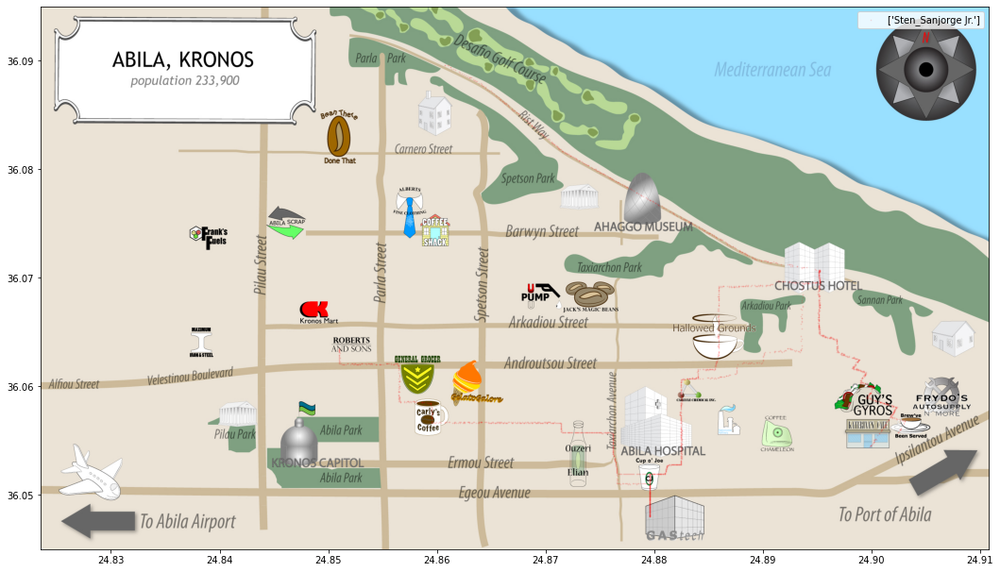

In [61]:
# plot by name
img = plt.imread("map-tourist.jpg")
for i in personnel_df['id'].unique():
    fig, ax = plt.subplots(figsize=(18,18))
    ax.imshow(img, extent=[24.8235, 24.9108, 36.045, 36.095])
    ax = plt.scatter(personnel_df.loc[personnel_df.id==i,'long'].values, personnel_df.loc[personnel_df.id==i,'lat'].values, 
                     color='red', s=0.5, label=personnel_df.loc[personnel_df.id==i,'FullName'].unique(), alpha=0.1)
    plt.legend()
    plt.show()

### Elsa Orilla's gps data is definitely distored.  Not sure if it is just noisy or shifted as well.  I don't think we should just throw it out, but I'm not sure how to clean it up

In [62]:
# GPS Data for non employee cars
res = list(set(gps_df['id']).difference(cars_df['CarID']))
res

[101, 104, 105, 106, 107]

In [63]:
# Employees that do not have a company car
cars_df.loc[cars_df['CarID'].isnull(),'FullName']

35         Albina_Hafon
36       Benito_Hawelon
37      Claudio_Hawelon
38            Henk_Mies
39       Valeria_Morlun
40          Adan_Morlun
41    Cecilia_Morluniau
42           Irene_Nant
43       Dylan_Scozzese
Name: FullName, dtype: object

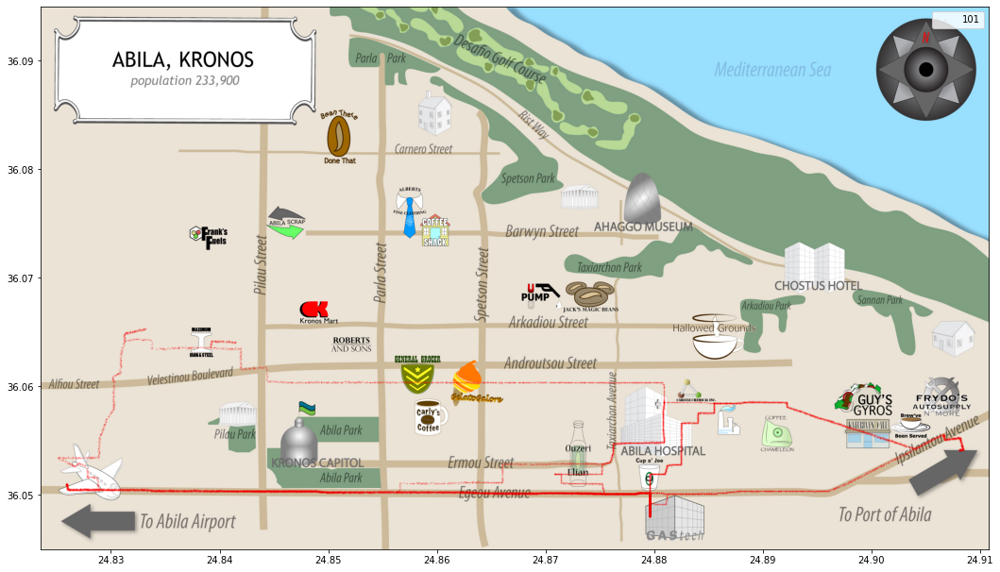

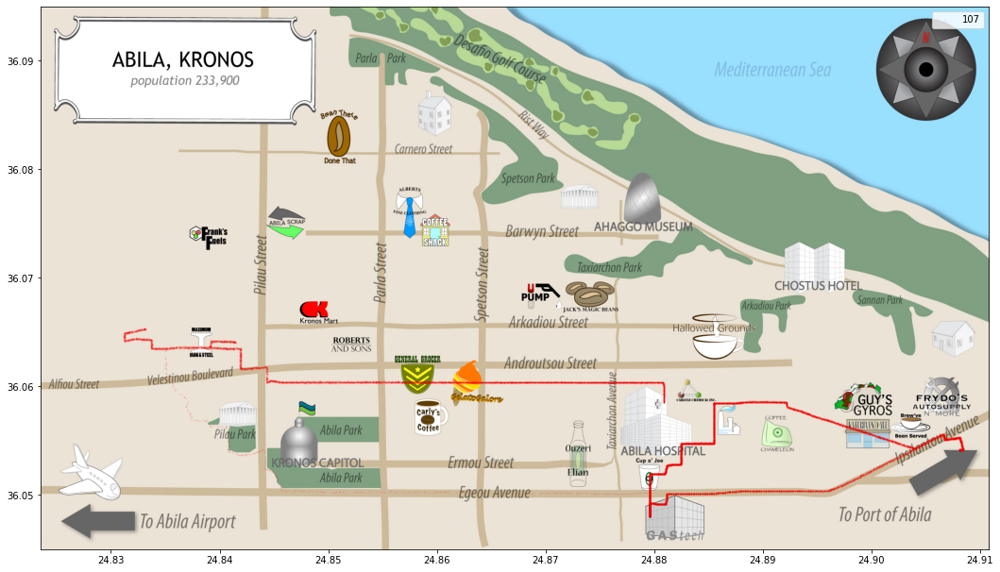

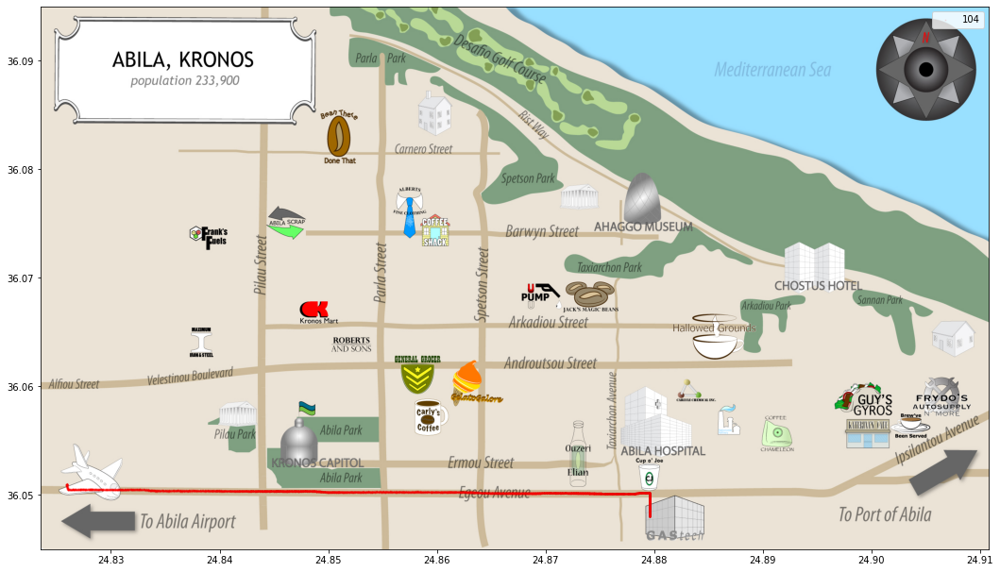

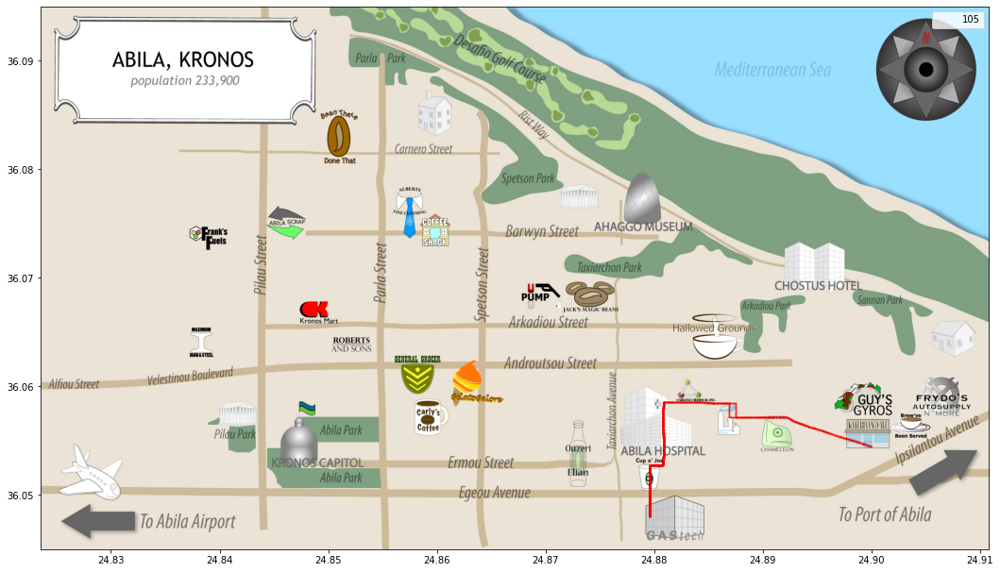

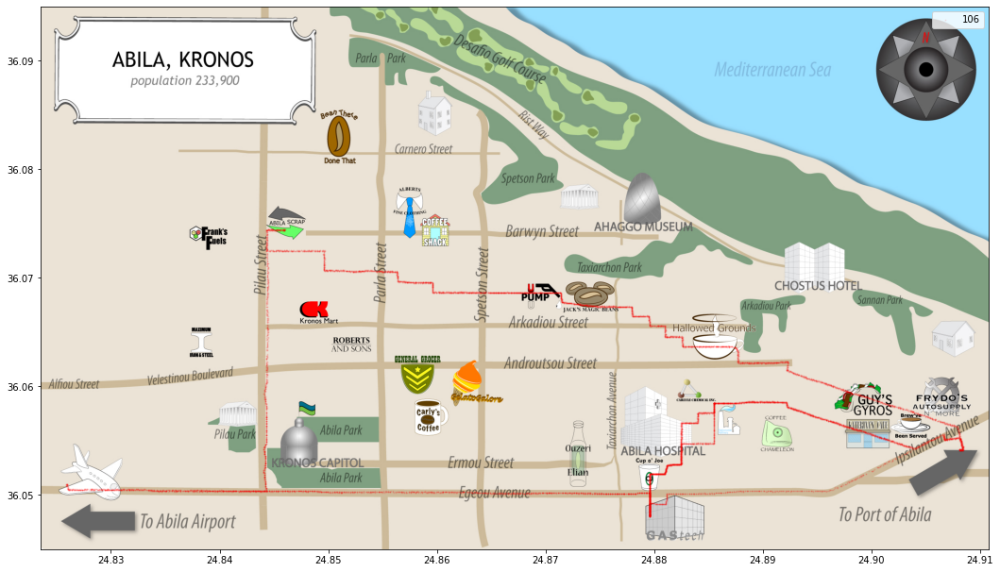

In [64]:
# Mysterious car activity
myst_df = gps_df.loc[gps_df.id.isin(res)]#gps.id>100]
img = plt.imread("map-tourist.jpg")
for i in myst_df['id'].unique():
    fig, ax = plt.subplots(figsize=(18,18))
    ax.imshow(img, extent=[24.8235, 24.9108, 36.045, 36.095])
    ax = plt.scatter(myst_df.loc[myst_df.id==i,'long'].values, myst_df.loc[myst_df.id==i,'lat'].values, color='red', s=0.5, label=i, alpha=0.1)
    plt.legend()
    plt.show()

### Vehicle 104 just travels between the airport and GAStech.  Vehicle 107 has a gap in travel with two separate routes

## Exploring purchase

In [65]:
# Kind of useful.  Might be good to look at by employment type or title group
groupedDF = purchases_df.groupby(['FullName','CurrentEmploymentType','CurrentEmploymentTitle']).agg({'price':['sum','count']})
sortedDF = groupedDF.sort_values(('price','sum'), ascending=False) #sort by sum
# sortedDF = groupedDF.sort_values(('price','count'), ascending=False) #sort by count
sortedDF

price  \
                                                                             sum   
FullName           CurrentEmploymentType  CurrentEmploymentTitle                   
Valeria_Morlun     Facilities             Truck Driver                  42514.25   
Cecilia_Morluniau  Facilities             Truck Driver                  36661.90   
Henk_Mies          Facilities             Truck Driver                  35993.68   
Dylan_Scozzese     Facilities             Truck Driver                  29315.42   
Irene_Nant         Facilities             Truck Driver                  28898.59   
Albina_Hafon       Facilities             Truck Driver                  21317.36   
Benito_Hawelon     Facilities             Truck Driver                  17531.88   
Adan_Morlun        Facilities             Truck Driver                  12700.57   
Lucas_Alcazar      Information Technology IT Helpdesk                   11453.52   
Claudio_Hawelon    Facilities             Truck Driver                  10765.39   
Orhan_Strum        Executive              SVP/COO                        2212.51   
Isia_Vann          Security               Perimeter Control              2078.64   
Felix_Resumir      Security               Security Group Manager         1855.27   
Ingrid_Barranco    Executive              SVP/CFO                        1826.36   
Isande_Borrasca    Engineering            Drill Technician               1815.14   
Varja_Lagos        Security               Badging Office                 1761.53   
Ada_Campo-Corrente Executive              SVP/CIO                        1727.17   
Hideki_Cocinaro    Security               Site Control                   1698.00   
Loreto_Bodrogi     Security               Site Control                   1631.45   
Brand_Tempestad    Engineering            Drill Technician               1610.42   
Edvard_Vann        Security               Perimeter Control              1607.00   
Vira_Frente        Engineering            Hydraulic Technician           1594.14   
Minke_Mies         Security               Perimeter Control              1584.58   
Sven_Flecha        Information Technology IT Technician                  1565.26   
Marin_Onda         Engineering            Drill Site Manager             1496.35   
Bertrand_Ovan      Facilities             Facilities Group Manager       1485.72   
Kanon_Herrero      Security               Badging Office                 1451.67   
Inga_Ferro         Security               Site Control                   1435.56   
Willem_Vasco-Pais  Executive              Environmental Safety Advisor   1416.62   
Adra_Nubarron      Engineering            Geologist                      1406.79   
Felix_Balas        Engineering            Engineer                       1311.27   
Birgitta_Frente    Engineering            Geologist                      1178.70   
Lars_Azada         Engineering            Engineer                       1166.66   
Lidelse_Dedos      Engineering            Engineering Group Manager      1150.24   
Stenig_Fusil       Security               Building Control               1131.95   
Gustav_Cazar       Engineering            Hydraulic Technician           1114.14   
Axel_Calzas        Engineering            Drill Technician               1111.92   
Hennie_Osvaldo     Security               Perimeter Control              1066.16   
Nils_Calixto       Information Technology IT Technician                  1000.35   
Isak_Baza          Information Technology IT Technician                   980.54   
Sten_Sanjorge Jr.  Executive              President/CEO                   799.68   
Elsa_Orilla        Engineering            Drill Technician                790.29   
Linnea_Bergen      Information Technology IT Group Manager                761.89   
Kare_Orilla        Engineering            Drill Technician                753.63   

                                                                              
                                               

In [72]:
personnel_df.head()

,Timestamp,id,lat,long,CurrentEmploymentType,CurrentEmploymentTitle,FullName
0,01/06/2014 06:28:01,35,36.076225,24.874689,Executive,Environmental Safety Advisor,Willem_Vasco-Pais
1,01/06/2014 06:28:01,35,36.076220,24.874596,Executive,Environmental Safety Advisor,Willem_Vasco-Pais
2,01/06/2014 06:28:03,35,36.076211,24.874443,Executive,Environmental Safety Advisor,Willem_Vasco-Pais
3,01/06/2014 06:28:05,35,36.076217,24.874253,Executive,Environmental Safety Advisor,Willem_Vasco-Pais
4,01/06/2014 06:28:06,35,36.076214,24.874167,Executive,Environmental Safety Advisor,Willem_Vasco-Pais


# Testing code below

ValueError: 
The fig parameter must be a dict or Figure.
    Received value of type <class 'matplotlib.figure.Figure'>: Figure(1296x1296)

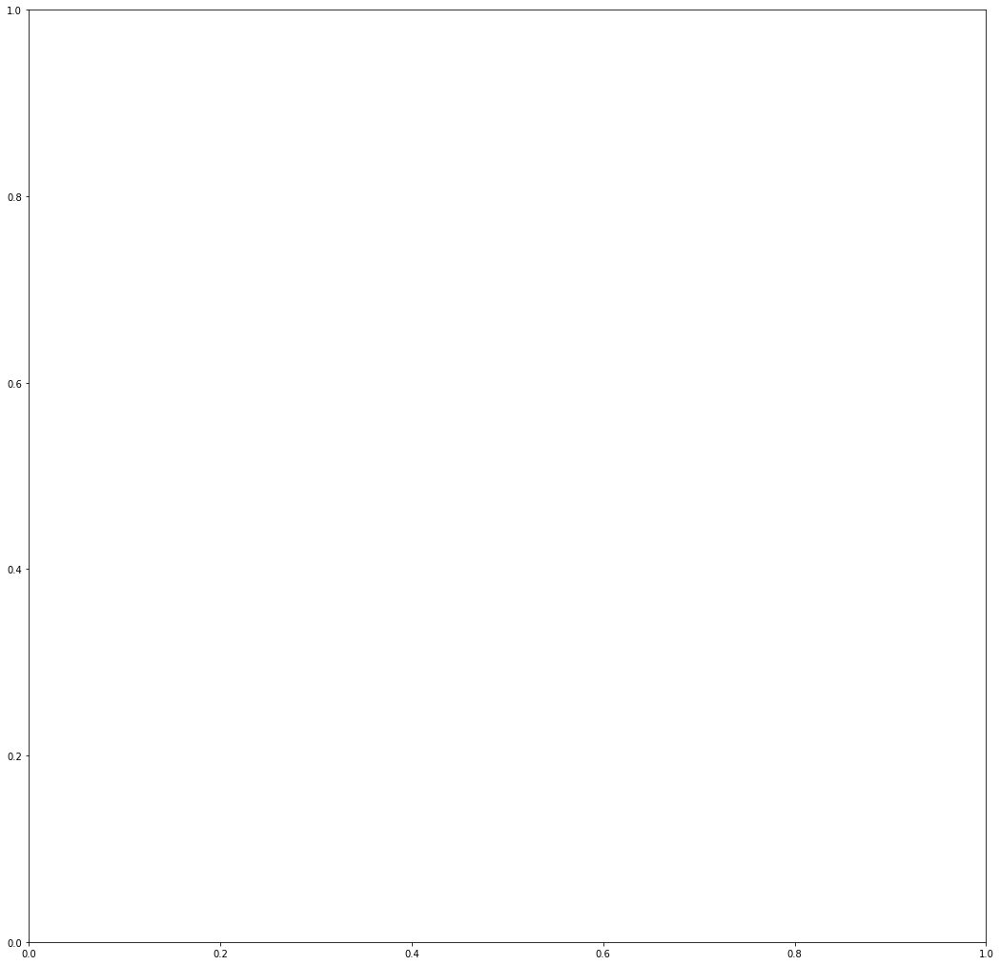

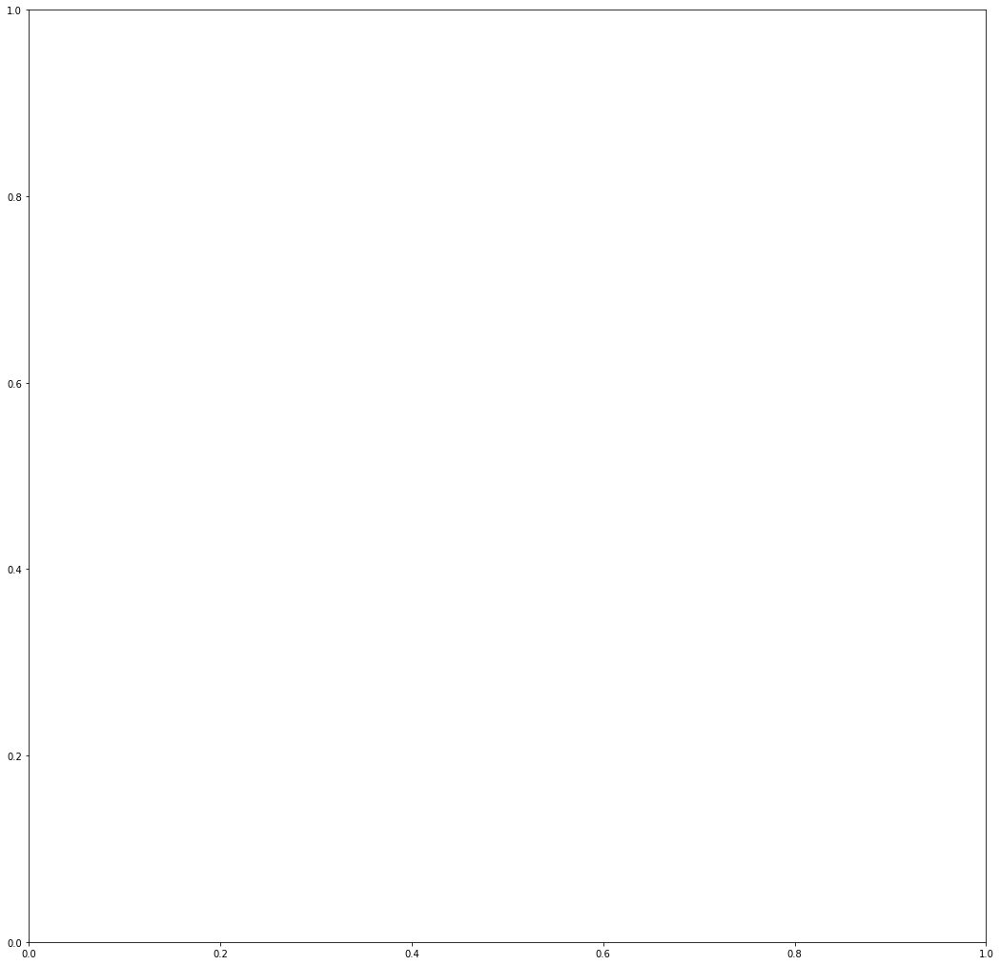

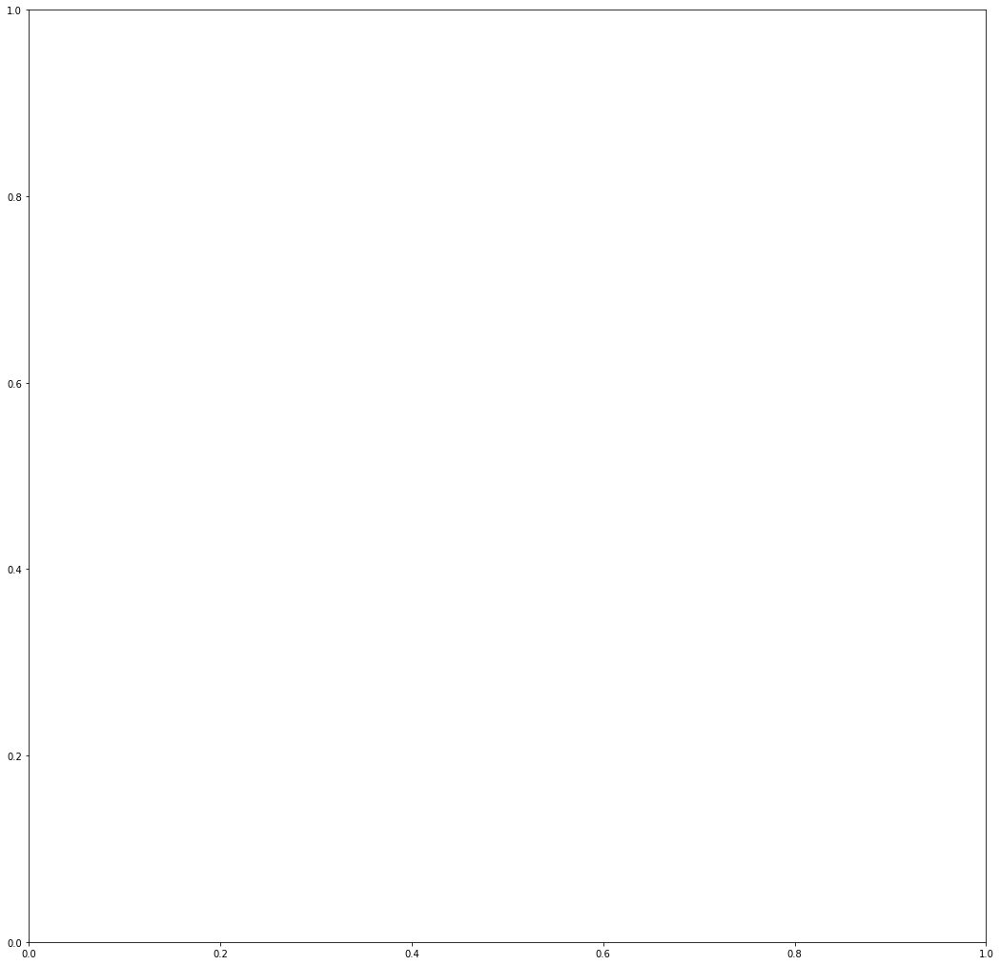

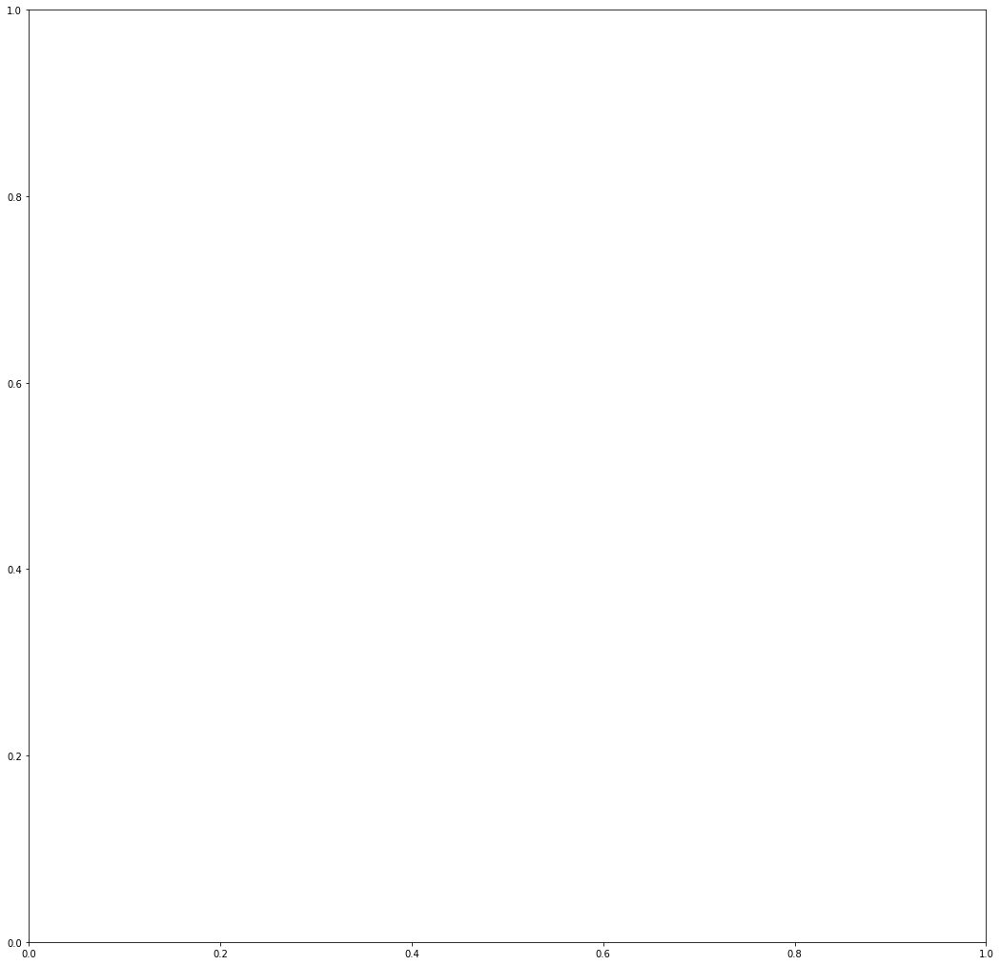

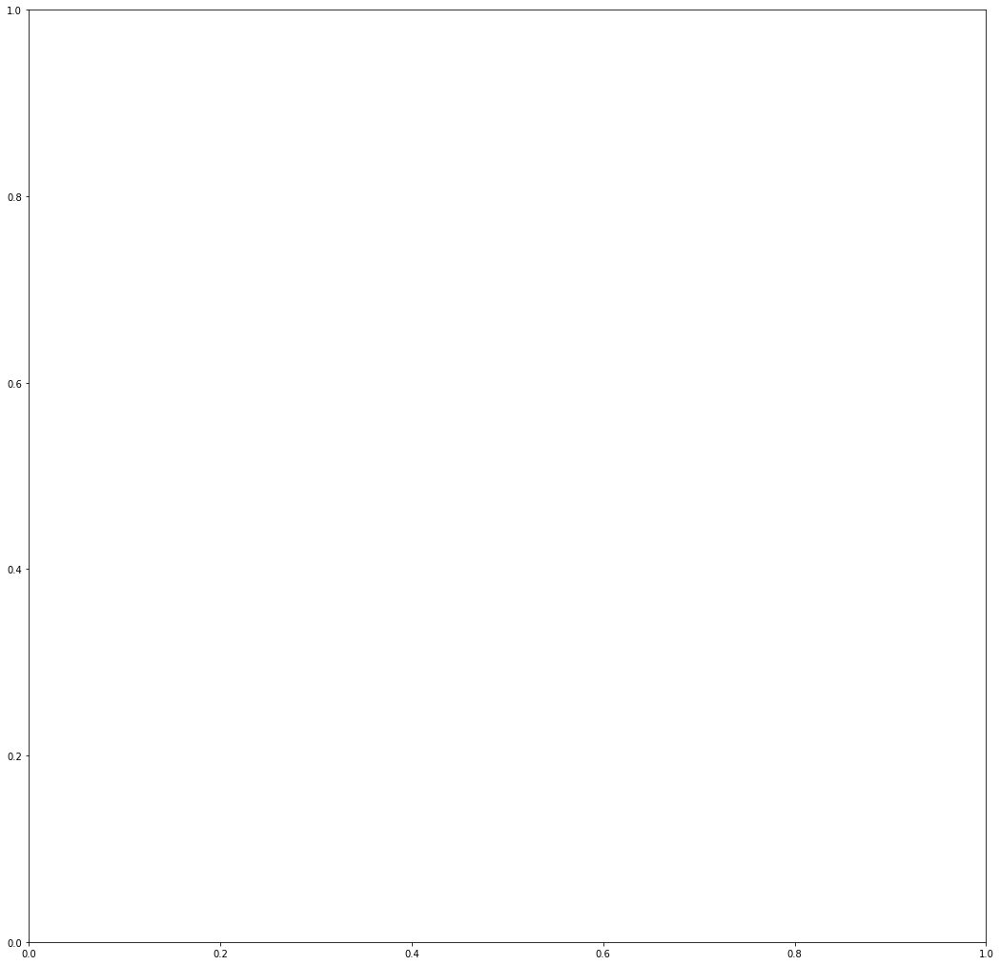

In [81]:
#testing animation plotting to show how the vehicle moves not just the total route.
import plotly
import plotly.express as px
import plotly.io as pio
myst_df = gps_df.loc[gps_df.id.isin(res)]
# img = plt.imread("map-tourist.jpg")
for i in myst_df['id'].unique():
    fig, ax = plt.subplots(figsize=(18,18))
    # ax.imshow(img, extent=[24.8235, 24.9108, 36.045, 36.095])
    ax = px.scatter(myst_df, x=myst_df.loc[myst_df.id==i,'long'].values, y=myst_df.loc[myst_df.id==i,'lat'].values,animation_frame=myst_df.loc[myst_df.id==i,'Timestamp'].values,
                 range_x=[24.8235, 24.9108],
                 range_y=[36.045, 36.095]
                )
pio.show(fig)

In [84]:
gps['id'].unique()

array([ 35,   4,  19,  10,   7,  11,  32,  34,  17,  12,  18,  20,  16,
         6,   3,  26,   1,  29,  21,  14,  33,  13,   2,  27,   8, 101,
        24,  23,  25,  30,  15,  28,   5,  22,   9, 107, 104, 105, 106,
        31])

In [40]:
print(os.getcwd())


/mnt/c/users/npowers/desktop/Drilling ML/School/DataScienceCapstone/7_FinalProjects/TheKronosIncidentGeospatial


In [68]:
# root = Path('TheKronosIncidentGeospatial', 'data')
# df = pd.read_csv(root / 'gps.csv')

In [37]:
p = Path('/data')
q = p / 'Geospacial'
q



PosixPath('/data/Geospacial')

In [38]:
q.exists()

False

In [39]:
q.is_dir()

False

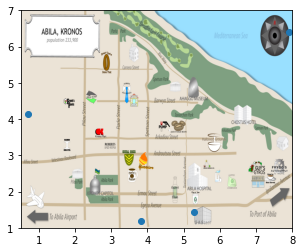

In [53]:
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(0)
x = np.random.uniform(0.0,10.0,15)
y = np.random.uniform(0.0,10.0,15)

datafile = 'map-tourist.jpg'
img = plt.imread(datafile)
plt.scatter(x,y,zorder=1)
plt.imshow(img, zorder=0, extent=[0.5, 8.0, 1.0, 7.0])
plt.show()

In [20]:
# cars.head()
# cars2 = cars.drop('CarID', axis=1)
# cars2.head()

,LastName,FirstName,CurrentEmploymentType,CurrentEmploymentTitle
0,Alcazar,Lucas,Information Technology,IT Helpdesk
1,Azada,Lars,Engineering,Engineer
2,Balas,Felix,Engineering,Engineer
3,Barranco,Ingrid,Executive,SVP/CFO
4,Baza,Isak,Information Technology,IT Technician


In [12]:
# profile = ProfileReport(cars, title="Pandas Profiling Report", explorative=True)
# profile

In [32]:
loyalty.head()
cc.head()
cars.head()
purchases.head()
personnel.head()

,Timestamp,id,lat,long,CurrentEmploymentType,CurrentEmploymentTitle,FullName
0,01/06/2014 06:28:01,35.0,36.076225,24.874689,Executive,Environmental Safety Advisor,Willem_Vasco-Pais
1,01/06/2014 06:28:01,35.0,36.076220,24.874596,Executive,Environmental Safety Advisor,Willem_Vasco-Pais
2,01/06/2014 06:28:03,35.0,36.076211,24.874443,Executive,Environmental Safety Advisor,Willem_Vasco-Pais
3,01/06/2014 06:28:05,35.0,36.076217,24.874253,Executive,Environmental Safety Advisor,Willem_Vasco-Pais
4,01/06/2014 06:28:06,35.0,36.076214,24.874167,Executive,Environmental Safety Advisor,Willem_Vasco-Pais


In [28]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
loyalty['business'] = le.fit_transform(loyalty['location'])
cc['business'] = le.fit_transform(cc['location'])

In [ ]:
for name in cc['FullName']:
    df=cc.loc[cc.FullName == name]
    df.set_index('timestamp')
    fig, ax=plt.subplots(figsize=(16,9))
    plt.plot('business')
    plt.show()
    

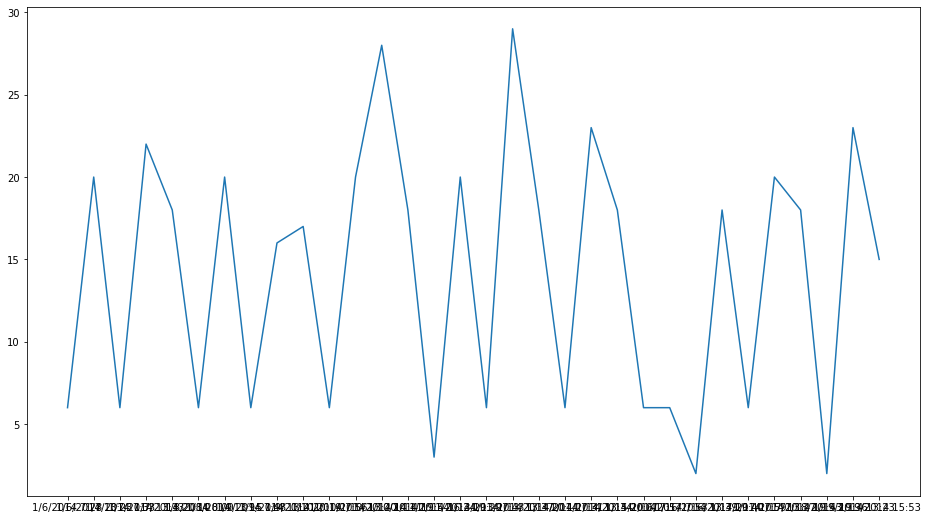

In [78]:
# This works but not very pretty or meaningful yet.  Need to break up by day
df=cc.loc[cc.FullName == 'Edvard_Vann']
# df
# df['timestamp'] = df['timestamp'].astype("datetime64")
# df
df = df.set_index('timestamp')
# df
fig, ax=plt.subplots(figsize=(16,9))
plt.plot(df['business'])
plt.show()

In [33]:
# # Example
# # Import Library

# import pandas as pd

# # Defne Data

# timeseries_data = { 
#     'Date': ['2021-12-26', '2021-12-29',
#              '2021-12-27', '2021-12-30',
#              '2021-12-28', '2021-12-31' ], 
    
#     'Washington': [42, 41, 41, 42, 42, 40],
    
#     'Canada' : [30, 30, 31, 30, 30, 30],
    
#     'California' : [51, 50, 50, 50, 50, 50]
# }

# # Create dataframe

# dataframe = pd.DataFrame(timeseries_data,columns=['Date', 'Washington', 'Canada', 'California'])
 
# # Changing the datatype

# dataframe["Date"] = dataframe["Date"].astype("datetime64")
 
# # Setting the Date as index

# dataframe = dataframe.set_index("Date")
# dataframe

In [34]:
# # Import Library

# import matplotlib.pyplot as plt

# # Plot
# fig, ax=plt.subplots(figsize=(16,9))
# plt.plot(dataframe["Canada"], marker='o')

# # Labelling 

# plt.xlabel("Date")
# plt.ylabel("Temp in Faherenheit")
# plt.title("Pandas Time Series Plot")

# # Display

# plt.show()

In [35]:
# # Import Library

# import matplotlib.pyplot as plt

# # Plot scatter
# fig, ax=plt.subplots(figsize=(16,9))
# plt.scatter(dataframe.index, dataframe["Washington"])

# # Labelling 

# plt.xlabel("Date")
# plt.ylabel("Temp in Faherenheit")

# # Auto space

# plt.tight_layout()

# # Display


# plt.show()